# Importations de packages

In [289]:
import pandas as pd
import numpy as np
import os
from bs4 import BeautifulSoup
import requests
import glob
import re
import xlwings
import math
import datetime

import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns

In [2]:
pd.set_option('display.max_columns', None)

# Import des données

### Données de la course

Import depuis le site du vendeeglobe

In [3]:
r = requests.get('https://www.vendeeglobe.org/fr/classement')
r.status_code
content = r.content.decode('utf-8')
soup = BeautifulSoup(content)

On cherche tous les liens de la forme suivante
https://www.vendeeglobe.org/download-race-data/vendeeglobe_20210304_170000.xlsx

In [4]:
l = soup.find('select', attrs={'class': 'form__input'}).text.split('- ')[1:]

In [5]:
def format_files(s):
    res = s.replace('-', '').replace(':', '').strip().replace(' ', '_')
    res = 'https://www.vendeeglobe.org/download-race-data/vendeeglobe_' + res + '.xlsx'
    return res
    
res = list(map(format_files, l)) # La liste contenant tous les chemins des fichiers excel à télécharger

La cellule suivante permet de charger tous les fichiers Excel, elle est désactivée car utile une seule fois

In [6]:
# save_path = 'data'
# for link in res:
#     resp = requests.get(link)
#     file_name = str(link)[-20:]
#     completeName = os.path.join(save_path, file_name)
#     output = open(completeName, 'wb')
#     output.write(resp.content)
#     output.close()

### Données des voiliers

Import depuis le glossaire du site du vendee globe

In [7]:
r_voiliers = requests.get('https://www.vendeeglobe.org/fr/glossaire')
# r_voiliers.status_code
content = r_voiliers.content.decode('utf-8')
soup_voiliers = BeautifulSoup(content)

In [8]:
header_voilier = []

for div_voilier in soup_voiliers.find_all('div', attrs={'class':'sv-g'})[1].find_all('div', attrs={'class':'sv-u-1'})[:1]:
    for li_voilier in div_voilier.find_all('li'):
        header_voilier.append(re.findall('([^:]*) :', li_voilier.text)[0])

header_voilier.extend(["Skipper", "Nom"])
df_voiliers = pd.DataFrame(columns=header_voilier)

In [9]:
indx = 0

div_voiliers = soup_voiliers.find_all('div', attrs={'class':'sv-g'})[1].find_all('div', attrs={'class':'sv-u-1'})
div_skippers = soup_voiliers.find_all('div', attrs={'class' : 'boats-list__infos'})

for div_voilier, div_skipper in list(zip(div_voiliers, div_skippers)):

    nom_voilier = div_skipper.find('h3').text
    nom_skipper = div_skipper.find('span').text
    values_to_add = {}
    values_to_add["Skipper"] = nom_skipper
    values_to_add["Nom"] = nom_voilier
    for li in div_voilier.find_all('li'):
        col = re.findall('([^:]*) :', li.text)[0]
        value = re.findall(' :(.*)', li.text)[0]
        values_to_add[col] = value
        
    row_to_add = pd.Series(values_to_add, name=indx)
    df_voiliers = df_voiliers.append(row_to_add)
    indx += 1

# Préparation des données

### Course

##### Debug d'un problème lié aux fichiers excel

In [10]:
# Code réalisé par Alexandre Le Bris pour régler un problème lié à 'xxid' 
# lors de la lecture des fichiers excel par pandas
import tempfile
from zipfile import ZipFile
import shutil
import os
from fnmatch import fnmatch
import re

def change_in_zip(file_name, name_filter, change):
    tempdir = tempfile.mkdtemp()
    try:
        tempname = os.path.join(tempdir, 'new.zip')
        with ZipFile(file_name, 'r') as r, ZipFile(tempname, 'w') as w:
            for item in r.infolist():
                data = r.read(item.filename)           
                data = change(data)
                w.writestr(item, data)
        shutil.move(tempname, file_name)
    finally:
        shutil.rmtree(tempdir)
        
# def change_all():
#     for filename in glob.glob('data/*'):
#         change_in_zip(filename, name_filter='xl/styles.xml', change=lambda d: re.sub(b'xxid="\d*"', b"", d))

def xlsx_broken(file):
    excel_app = xlwings.App(visible=False)
    excel_book = excel_app.books.open(file)
    excel_book.save()
    excel_book.close()
    excel_app.quit()
    return

n2_change_all = len(glob.glob('data/*'))
def change_all(n1=0, n2 = n2_change_all):
    
    for filename in glob.glob('data/*')[n1:n2]:
        print(filename)
        xlsx_broken(filename)
        print("done")

In [11]:
# change_all(250) # à n'executer qu'une fois

##### Construction des dataframes

In [12]:
col_vendee = ['Date', 'Rang', 'Nat/Voile', 
        'Skipper/Bateau', 'Heure_Fr', 'Lat', 
        'long', 'Cap_30m', 'Vitesse_30m', 
        'VMG_30m', 'Distance_30m'
        , 'Cap_class', 'Vitesse_class', 
        'VMG_class', 'Distance_class'
        , 'Cap_24h', 'Vitesse_24h', 
        'VMG_24h', 'Distance_24h'
        , 'DTF', 'DTL']

In [15]:
### Construction de df_vendee en affichant une marque toutes les 50 itérations

l_df = []
l_banned_files = [r'data\20201108_120200.xlsx']
abs_path = r"C:\Users\Pierrick\OneDrive\Bureau\K\2_MS_TelecomParis\Cours\INFMDI721_Kit_Big_Data\PierrickLeroy\Projet_final\\"
cnt = 0
start = datetime.datetime.now()
for filename in glob.glob('data/*')[:483]:
    cnt += 1
    if cnt%50 == 0:
        print(cnt, 'fichiers chargés en', datetime.datetime.now() - start)
    if filename in l_banned_files:
        continue
        
    print(filename)    
    
    date = re.findall(r"\d{8}_\d{6}", filename)[0]
    df = pd.read_excel(abs_path + filename
             , skiprows = 5
             , header = None
             , names = col_vendee)
    df['Date'] = date
    l_df.append(df)
    
df_vendee = pd.concat(l_df)

data\20201108_140000.xlsx
data\20201108_150000.xlsx
data\20201108_170000.xlsx
data\20201108_210000.xlsx
data\20201109_040000.xlsx
data\20201109_080000.xlsx
data\20201109_110000.xlsx
data\20201109_140000.xlsx
data\20201109_170000.xlsx
data\20201109_210000.xlsx
data\20201110_040000.xlsx
data\20201110_080000.xlsx
data\20201110_110000.xlsx
data\20201110_140000.xlsx
data\20201110_170000.xlsx
data\20201110_210000.xlsx
data\20201111_040000.xlsx
data\20201111_080000.xlsx
data\20201111_110000.xlsx
data\20201111_140000.xlsx
data\20201111_170000.xlsx
data\20201111_210000.xlsx
data\20201112_040000.xlsx
data\20201112_080000.xlsx
data\20201112_110000.xlsx
data\20201112_140000.xlsx
data\20201112_170000.xlsx
data\20201112_210000.xlsx
data\20201113_040000.xlsx
data\20201113_080000.xlsx
data\20201113_110000.xlsx
data\20201113_140000.xlsx
data\20201113_170000.xlsx
data\20201113_210000.xlsx
data\20201114_040000.xlsx
data\20201114_080000.xlsx
data\20201114_110000.xlsx
data\20201114_140000.xlsx
data\2020111

data\20201229_170000.xlsx
data\20201229_210000.xlsx
data\20201230_040000.xlsx
data\20201230_080000.xlsx
data\20201230_110000.xlsx
data\20201230_140000.xlsx
data\20201230_170000.xlsx
data\20201230_210000.xlsx
data\20201231_040000.xlsx
data\20201231_080000.xlsx
data\20201231_110000.xlsx
data\20201231_140000.xlsx
data\20201231_170000.xlsx
data\20201231_210000.xlsx
data\20210101_040000.xlsx
data\20210101_080000.xlsx
data\20210101_110000.xlsx
data\20210101_140000.xlsx
data\20210101_170000.xlsx
data\20210101_210000.xlsx
data\20210102_040000.xlsx
data\20210102_080000.xlsx
data\20210102_110000.xlsx
data\20210102_140000.xlsx
data\20210102_170000.xlsx
data\20210102_210000.xlsx
data\20210103_040000.xlsx
data\20210103_080000.xlsx
data\20210103_110000.xlsx
data\20210103_140000.xlsx
data\20210103_170000.xlsx
data\20210103_210000.xlsx
data\20210104_040000.xlsx
data\20210104_080000.xlsx
data\20210104_110000.xlsx
data\20210104_140000.xlsx
data\20210104_170000.xlsx
data\20210104_210000.xlsx
data\2021010

##### Fonctions auxiliaires au preprocessing

In [16]:
def correction_NAT(s):
    '''
    Corrige la nationalité des skippers par exemple FRFRA -> FRA
    Si nationalité correcte JPN -> JPN
    '''
    if type(s)==float and math.isnan(s):
        return np.nan
    if len(s)==3:
        return s
    else :
        return s[-3:]
    
def extract_digits(s):
    """
    Extraire les chiffres des colonnes d'intérêt pour les données de la course vendée globe
    """
    if type(s)==float and math.isnan(s):
        return np.nan
    return re.findall('([-\d]*.\d*)[ °]',s)[0]

cols_digits = ['Cap_30m', 'Vitesse_30m', 'VMG_30m', 'Distance_30m', 'Cap_class', 'Vitesse_class'
              , 'VMG_class', 'Distance_class', 'Cap_24h', 'Vitesse_24h', 'VMG_24h', 'Distance_24h', 'DTF', 'DTL']



In [18]:
def extract_voile(s):
    """
    Fonction permettant d'extraire le numéro de voile à partir d'une chaîne de caractères
    """
    if type(s)==float and math.isnan(s):
        return np.nan
    return re.findall('(\d{1,4})', s)[0]

In [160]:
#Fonction de conversion des coordonnées satellites en nombre

def dms2dd(degrees, minutes, seconds, direction):
    dd = float(degrees) + float(minutes)/60 + float(seconds)/(60*60);
    if direction == 'S' or direction == 'W':
        dd *= -1
    return dd;

def dd2dms(deg):
    d = int(deg)
    md = abs(deg - d) * 60
    m = int(md)
    sd = (md - m) * 60
    return [d, m, sd]


def parse_dms(dms):
    if type(dms)==float and math.isnan(dms):
        return np.nan, np.nan
    parts = re.split('[^\d\w]+', dms)
    lat = dms2dd(parts[0], parts[1], parts[2], parts[3])
    lng = dms2dd(parts[4], parts[5], parts[6], parts[7])

    return (lat, lng)

def get_lat(dms):
    return parse_dms(dms)[0]

def get_long(dms):
    return parse_dms(dms)[1]

##### Preprocessing

In [495]:
def preparation_voiliers(df):
    df_voiliers = df.copy()
    df_voiliers['Voile'] = df_voiliers['Numéro de voile'].apply(extract_voile)
    df_voiliers['Voile'] = df_voiliers['Voile'].astype(float)
    
    # Correction des numéros de voiles non harmonisés entre les fichiers
    df_voiliers.loc[df_voiliers["Nom"] == 'LinkedOut', 'Voile'] = 59.0
    df_voiliers.loc[df_voiliers["Nom"] == 'MEDALLIA', 'Voile'] = 777.0
    df_voiliers.loc[df_voiliers["Skipper"] == 'Boris HERRMANN', 'Voile'] = 10.0
    
    return df_voiliers

df_voiliers_prep = preparation_voiliers(df_voiliers)

In [661]:
def preparation_vendee(df):
    df_vendee = df.copy()
    
    df_vendee = df_vendee.dropna(subset=["Nat/Voile"]) # On supprime toutes les enregistrements n'ayant pas de skipper
    df_vendee.loc[:, 'Date']  = pd.to_datetime(df_vendee.loc[:, 'Date'], format = '%Y%m%d_%H0000') # On parse la colonne de dates
    df_vendee[['Nat','Voile']] = df_vendee['Nat/Voile'].str.replace('\n', '').str.split(' ',expand=True)
    
    # Correction des erreurs de typographie sur la nationalité
    df_vendee['Nat'] = df_vendee['Nat'].apply(correction_NAT)
    
    # Création de 2 colonnes skipper et bateau
    df_vendee[['Skipper','Bateau']] = df_vendee['Skipper/Bateau'].str.split('\n',expand=True)
    
    # Récupération de toutes les données sous forme numérique
    for col in cols_digits:
        df_vendee[col] = df_vendee[col].apply(extract_digits)
    
    # Suppression de colonnes inutiles (1)
    df_vendee = df_vendee.drop(columns = ['Nat/Voile', 'Heure_Fr','Skipper/Bateau'])
    df_vendee['Voile'] = df_vendee['Voile'].astype(float)
    
    # Jointure avec les informations des voiliers
    df_vendee = df_vendee.merge(df_voiliers_prep , how = 'left', left_on = 'Voile', right_on = 'Voile', copy = False)
    
    
    # Suppression de colonnes inutiles (2) et processing
    df_vendee = df_vendee.drop(columns = ['Skipper_x', 'Bateau'])
    df_vendee = df_vendee.rename(columns={"Skipper_y": "Skipper"})
    df_vendee['Lat_float'] = (df_vendee['Lat'] +' '+ df_vendee['long']).apply(lambda x : get_lat(x))
    df_vendee['long_float'] = (df_vendee['Lat'] +' '+ df_vendee['long']).apply(lambda x : get_long(x))
    
    # Ajout d'une colonne rang final
    df_vendee = df_vendee.merge(df_final_rank, how='left', left_on='Voile', right_on='Voile', copy = False, suffixes = [None, '_final'])
    
    # Création d'une colonne sans valeurs nulles pour faciliter certaines visualisations
    df_vendee['DTF'] = df_vendee['DTF'].astype(float)
    df_vendee["DTF_filled"]  = df_vendee.sort_values(by = ['Skipper', 'Date'])['DTF'].fillna(method='ffill')
    
    # Ajout d'une colonne particulière pour l'affichage des couleurs dans une visualisation
    df_vendee['RET'] = df_vendee['Rang'] == 'RET'
    df_vendee.loc[df_vendee['Skipper'] == 'Yannick BESTAVEN',  'RET'] = 'Yannick BESTAVEN'
    
    return df_vendee

df_vendee_prep = preparation_vendee(df_vendee)

# Storytime : Vendée Globe 2020/2021

Dans cette partie nous allons nous intéresser au vainqueur de l'édition, Yannick Bestaven et aux trajets suivis par les skippers. Nous allons aussi constater le rythme effréné de l'édition 2020/2021 entre arrivées dans un mouchoir de poche et nombreux abandons.

---

Commençons par afficher le trajet de Yannick par rapport à quelques uns de ses concurrents

In [239]:
# Afficher le parcours de tous les skippers avec Bestaven en rouge


def is_bestaven(s):
    if s=='Yannick BESTAVEN':
        return 'Yannick BESTAVEN'
    else:
        return 'Concurrent'


l_skipper = df_vendee_prep['Skipper'].unique()[10:20]

df = df_vendee_prep[df_vendee_prep['Skipper'].isin(l_skipper)]
df["is_Bestaven"] = df['Skipper'].apply(is_bestaven)

df = df.sort_values(by = ['Skipper', 'Date'])

fig = px.line_geo(df, 
                  lat="Lat_float", lon = 'long_float',
                  color="is_Bestaven", # "continent" is one of the columns of gapminder
                  projection="orthographic")
fig.show()

<ipython-input-239-2653d0d5db90>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



On peut déjà faire une observation : Yannick Bestaven semble avoir pu anticiper sur son tour de l'antarctique en faisant cap à l'est assez tôt dans la course.

---

Intéressons nous maintenant aux leaders de la courses et tentons de voir si ils ont pris une route différentes de leurs concurrents.
Le chapeau 1 des skippers est composé des 5 skippers arrivés premiers, le chapeau 2 est constitué des autres Skippers

In [255]:
# Afficher le parcours avec le rang final comme couleur

df = df_vendee_prep
df = df.sort_values(by = ['Skipper', 'Date'])
df['Chapeau_final'] = np.digitize(df['Rang_final'].replace('RET', 26).astype(int), [1,5])
fig = px.line_geo(df, 
                  lat="Lat_float", lon = 'long_float',
                  color="Chapeau_final", # "continent" is one of the columns of gapminder
                  projection="orthographic")
fig.show()

On remarque ici que tous les skippers on respecté la Zone d'Exclusion de l'Antarctique (ZEA), qui est une zone de sécurité délimitée autour de l'antarctique pour éviter aux skippers de rencontrer des icebergs
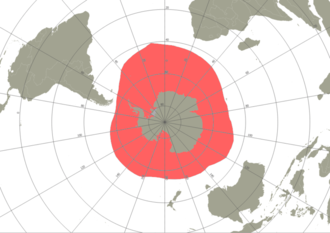

Source : Parcours sur Wikipédia https://fr.wikipedia.org/wiki/Vendée_Globe_2020-2021#Parcours

#### Etude des vitesses

Il semble que tous les skippers aient suivi un chemin similaire (en première approximation), les différences se feront sans doute sur la vitesse de leur embarcation.

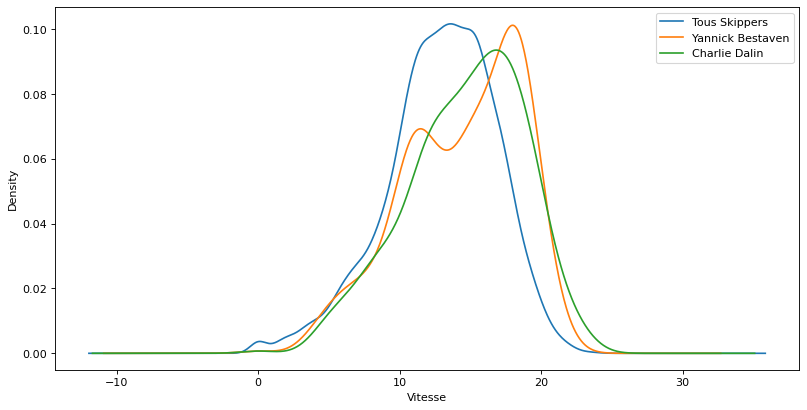

In [277]:
# Histogramme des vitesses globales, tout au long de la course
figure(figsize=(12, 6), dpi=80)
df_vendee_prep['Vitesse_class'].astype(float).plot.kde(label = 'Tous Skippers')
df_vendee_prep.loc[df_vendee_prep['Skipper'] == 'Yannick BESTAVEN', 'Vitesse_class'].astype(float).plot.kde(label = 'Yannick Bestaven')
df_vendee_prep.loc[df_vendee_prep['Skipper'] == 'Charlie DALIN', 'Vitesse_class'].astype(float).plot.kde(label = 'Charlie Dalin')
plt.xlabel('Vitesse')
plt.legend()

Le profil de vitesse sur la course de Yannick Bestaven est particulier puisqu'il semble avoir eu 2 régimes différents lors de la course, peut-être est-ce le marqueur de l'utilisation de foils ?

<ipython-input-440-283bef57f6d0>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 1.0, 'Distance to finish en fonction de la date : une édition très disputée')

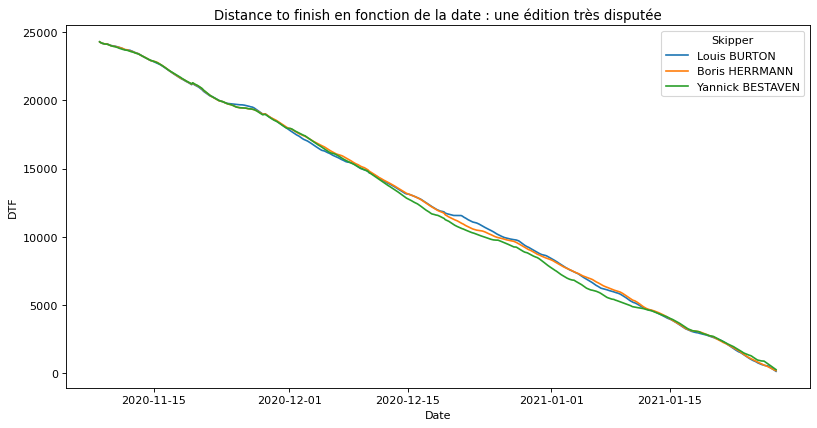

In [440]:
# KM restants en fonction du temps pour Bestaven
l_skipper = ['Boris HERRMANN', 'Louis BURTON', 'Yannick BESTAVEN']

figure(figsize=(12, 6), dpi=80)
df = df_vendee_prep.loc[df_vendee_prep['Skipper'].isin(l_skipper)]
df['DTF'] = df['DTF'].astype(float)
sns.lineplot(data=df, x="Date", y="DTF", hue = 'Skipper')

plt.title("Distance to finish en fonction de la date : une édition très disputée")

Yannick Bestaven semble avoir pris un peu d'avance courant Janvier, entre 13 000 et 5 000 km de l'arrivée mais tout s'est finalement joué au finish. L'édition 2020/2021 a été très disputée avec 8 skippers arrivés le même jour.

<ipython-input-345-fddf01b68df7>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-345-fddf01b68df7>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:xlabel='DTF', ylabel='Vitesse_class'>

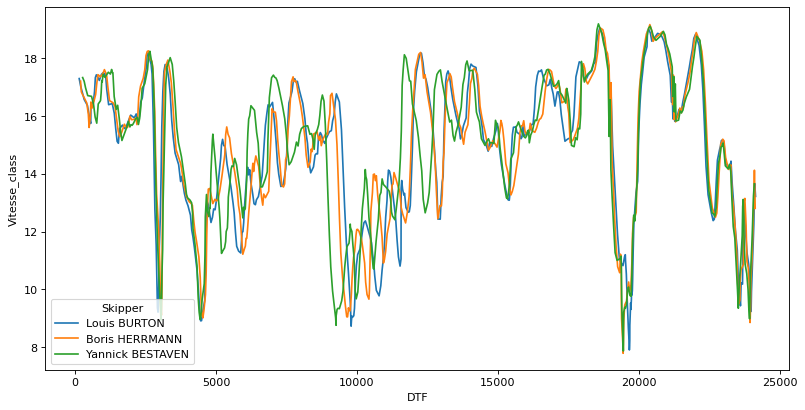

In [345]:
# Vitesse au fur et à mesure de la course, lissée
l_skipper = ['Boris HERRMANN', 'Louis BURTON', 'Yannick BESTAVEN']
#              , 'Sébastien SIMON', 'Miranda MERRON']Louis BURTON
# l_skipper = ['Yannick BESTAVEN']
figure(figsize=(12, 6), dpi=80)
df = df_vendee_prep.loc[df_vendee_prep['Skipper'].isin(l_skipper)]


df['DTF'] = df['DTF'].astype(float)
df['Vitesse_class'] = df['Vitesse_class'].rolling(20).mean().astype(float)
sns.lineplot(data=df, x="DTF", y="Vitesse_class", hue = 'Skipper')

Les profils de courbe de vitesse des différents skippers sont superposables : globalement tous les skippers sont allés vites et lentement aux mêmes endroits. C'est un nouveau signe que l'édition a dû être disputée : les bateaux devaient être au coude à coude.

On peut remarquer un déphasage de Yannick Bestaven entre 5000 et 13 000 km de l'arrivée, concommitant avec son avance sur le peloton (cf dernière visualisation)

In [457]:
# Afficher le parcours de skippers sur l'intervalle 13 000 - 5 000 km avant l'arrivée

l_skipper = ['Boris HERRMANN', 'Louis BURTON', 'Yannick BESTAVEN']


df = df_vendee_prep[(df_vendee_prep['Skipper'].isin(l_skipper)) & (df_vendee_prep['DTF']>5000) & (df_vendee_prep['DTF'] < 13000)]

df = df.sort_values(by = ['Skipper', 'Date'])

fig = px.line_geo(df, 
                  lat="Lat_float", lon = 'long_float',
                  color="Skipper", # "continent" is one of the columns of gapminder
                  projection="orthographic", hover_name = 'DTF', title = 'Parcours de 3 Skippers de 13 000 km à 5 000 km de l arrivee')
fig.show()

#### Les abandons

L'édition 2020/2021 a vu 6 Skipper abandonner, dont la plupart en peu de temps...

Text(2020-12-10, 1, 'Abandons du Cap de Bonne Espérance')

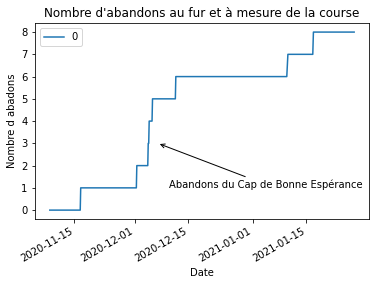

In [426]:
df_RET = df_vendee_prep[df_vendee_prep['Rang'] == 'RET']
df_RET = df_RET.groupby('Date').size().to_frame()


pd.Series(df_vendee_prep['Date'].unique()).to_frame(name='Date').merge(df_RET.reset_index(), how='left', left_on = 'Date', right_on = 'Date').fillna(0.0).set_index('Date').plot()
plt.ylabel('Nombre d abadons')
plt.title("Nombre d'abandons au fur et à mesure de la course")

plt.annotate("Abandons du Cap de Bonne Espérance",
            xy=("2020-12-07", 3), xycoords='data',
            xytext=("2020-12-10", 1), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"),
            )

In [378]:
# Les abandons : nombre au fur et à mesure de la course et emplacement sur plotly

df = df_vendee_prep[df_vendee_prep['Rang_final'] == 'RET']
df = df.sort_values(by = ['Skipper', 'Date'])

fig = px.line_geo(df, 
                  lat="Lat_float", lon = 'long_float',
                  color="Skipper", # "continent" is one of the columns of gapminder
                  projection="orthographic")
fig.show()

La vague d'abandon du Cap de Bonne-Espérance (Afrique du sud) est dû à des problèmes divers, apparemment indépendants.
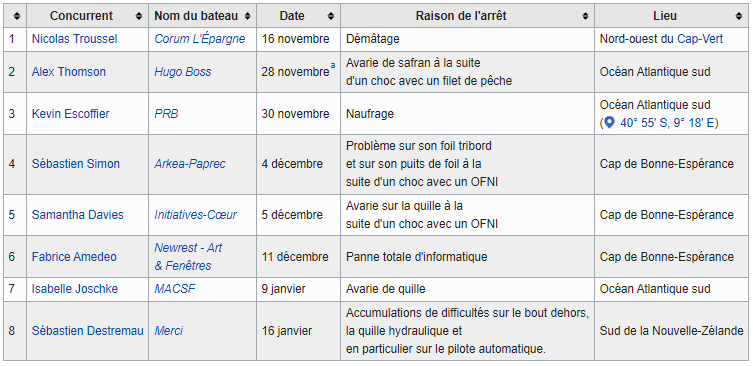

#### Récapitulatif de la course

In [645]:
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

In [669]:
colors = dict(zip(
    df_vendee_prep['RET'].unique(),
    ['#6699d8', '#FF3333', '#d3dbdc']
))

def draw_barchart(frame):
    
    ax.clear()
    df = df_vendee_prep[df_vendee_prep['Date'] == frame]
    
#### Customiser la fonction couleur ?
    c = []
    for x in df['RET']:
        c.append(colors[x])
        
    ax.barh(df['Skipper'], df['DTF_filled'], color =c, label = c)
    for i, (value, name) in enumerate(zip(df['DTF_filled'], df['Skipper'])):
    #     ax.text(value, i,     name,            ha='right')  # Tokyo: name
    #     ax.text(value, i-.25, group_lk[name],  ha='right')  # Asia: group name
        ax.text(value, i-0.3,     round(round(value, -1)),           ha='left')
    plt.legend(df['Skipper'])
    plt.title("Résumé de la course de Yannick Bestaven")
        

In [677]:
range_date = iter(df_vendee_prep['Date'].unique())

In [683]:
range_date_restricted = []
cnt = 0
d = 5
for x in df_vendee_prep['Date'].unique():
    if cnt == d :
        range_date_restricted.append(x)
        cnt=0
    cnt += 1
range_date_restricted = iter(range_date_restricted)

###### Aide de lecture pour le graphique ci dessous
---

- en rouge : Yannick Bestaven
- en gris : les skippers ayant abandonné
- dans l'encadré : le leader de la course

En abscisse, le nombre de km restants pour chaque skipper, indiqué en ordonnées

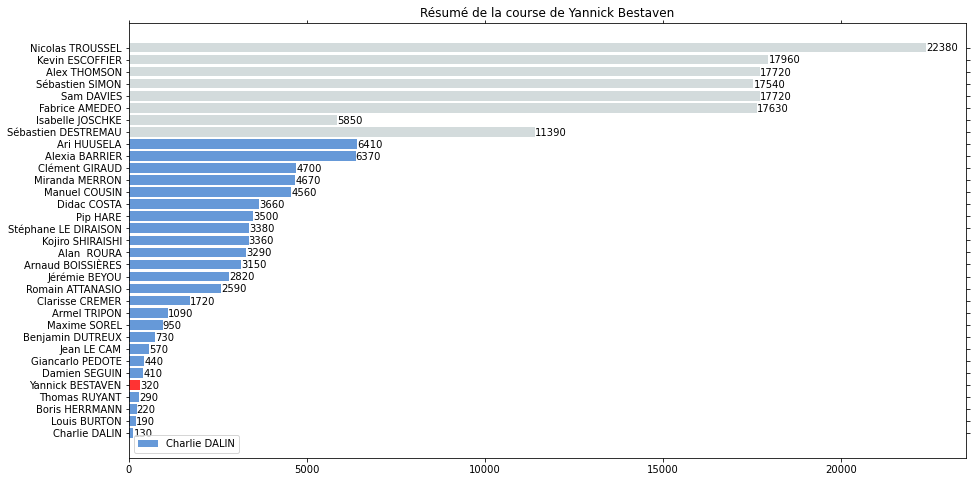

In [684]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=range_date_restricted)
HTML(animator.to_jshtml())

Yannick Bestaven a mené la course un moment pour finalement se faire doubler au finish ! Il finit néanmoins premier grâce à une compensation en temps pour avoir secouru un autre skipper qui avait fait naufrage. Bravo à lui et bon vent pour la transat Jacques Vabre qui commence aujourd'hui !
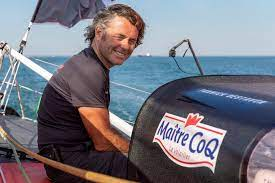